In [1]:
%load_ext autoreload
%autoreload 2
import os
import pickle
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from sklearn.linear_model import LinearRegression

from src.dataloader.analysis_io import (
    load_step3_and_mm_results,
    load_step1_and_states,
)

from src.regression_plot_helper import BootstrappedRegressor

import scienceplots

plt.style.use(['ieee','notebook', 'bright'])
plt.rcParams["mathtext.fontset"] = "cm"


In [2]:
result_dir = "/system/user/tran/publicwork2/triply_efficient2/data/results/approx_recovery_jacc/"  # 6m10s at best

In [3]:
all_s1 = load_step1_and_states(
    result_dir=result_dir,
)

loaded state_type='gibbs', n=2, recs=96
loaded state_type='gibbs', n=3, recs=100
loaded state_type='gibbs', n=4, recs=100
loaded state_type='gibbs', n=5, recs=100
loaded state_type='gibbs', n=6, recs=0
loaded state_type='gibbs', n=7, recs=0
loaded state_type='special', n=2, recs=2
loaded state_type='special', n=3, recs=2
loaded state_type='special', n=4, recs=2
loaded state_type='special', n=5, recs=2
loaded state_type='special', n=6, recs=0
loaded state_type='special', n=7, recs=0
(2828, 8)


  0%|          | 0/1212 [00:00<?, ?it/s]

/system/user/publicwork/tran/triply_efficient2/src/dataloader/analysis_io.py:98: RuntimeWarning: Mean of empty slice
  lambda x: np.nanmean(x)
/system/user/tran/publicwork2/triply_efficient2/.venv/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/system/user/publicwork/tran/triply_efficient2/src/dataloader/analysis_io.py:104: RuntimeWarning: All-NaN slice encountered
  lambda x: np.nanmedian(x)


loaded and processed (1212, 14) results
Loaded (1212, 21) merged results from step1 and states


In [4]:
bigs3, all_mms3, _ = load_step3_and_mm_results(
    result_dir=result_dir,
    all_s1=all_s1,
    # n_values=[4],
    # eps_values=[0.05],
)

Loading all stage3 results from /system/user/tran/publicwork2/triply_efficient2/data/results/approx_recovery_jacc/
Found 1212 jobdirs


Found 1212 jobdirs with stage3 results


Loading stage3 result files:   0%|          | 0/1212 [00:00<?, ?it/s]

/system/user/tran/publicwork2/triply_efficient2/.venv/lib/python3.13/site-packages/pandas/core/algorithms.py:1743: RuntimeWarning: Mean of empty slice
  return lib.map_infer(values, mapper, convert=convert)
/system/user/tran/publicwork2/triply_efficient2/.venv/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:2019: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Loaded (23873, 18) stage3 results
Found 1212 jobdirs


/system/user/tran/publicwork2/triply_efficient2/.venv/lib/python3.13/site-packages/pandas/core/algorithms.py:1743: RuntimeWarning: All-NaN slice encountered
  return lib.map_infer(values, mapper, convert=convert)


Loading mimicking result files:   0%|          | 0/1212 [00:00<?, ?it/s]

Discard 366 failed N1 search rows out of 24240 total.


  0%|          | 0/119365 [00:00<?, ?it/s]

In [5]:
all_s1_long = all_s1.explode(["samples_needed", "preds", "trial_idx", "Js"])

In [6]:
regressor_model = LinearRegression


# step1 fits

## get exponent of eps from slope of log(samples_needed) vs log(eps)

In [7]:
plot_df = all_s1_long.copy()
state_types = ["gibbs", "zero", "ghz"]
n_values = sorted(plot_df["n"].unique())

# Prepare subplots
fig, axes = plt.subplots(
    nrows=len(n_values),
    ncols=3,
    figsize=(18, 5 * len(n_values)),
    sharex="col",
    sharey="row",
)

fit_results = []
for i, n in enumerate(n_values):
    for j, state in enumerate(state_types):

        ax = axes[i, j]
        temp = plot_df[(plot_df["n"] == n) & (plot_df["state_type"] == state)].copy()
        temp["|S|/2**n"] = temp["|S|"] / 2 ** temp["n"]
        temp = temp.dropna(subset=["eps", "med_samples", "samples_needed"])
        temp["log_inv_eps"] = np.log2(1 / temp["eps"])
        temp["log_samples_needed"] = np.log2(temp["samples_needed"].astype(float))

        if temp.empty:
            continue

        sns.scatterplot(
            data=temp,
            x="log_inv_eps",
            y="log_samples_needed",
            hue="|S|/2**n",
            palette="viridis",
            ax=ax,
            alpha=0.3,
        )

        x = temp["log_inv_eps"].values.reshape(-1, 1)
        y = temp["log_samples_needed"].values

        reg = BootstrappedRegressor(
            model_cls=regressor_model, n_bootstrap=100, random_state=0
        )
        reg.fit(x, y)

        slope = reg.slope_med
        slope_ci = reg.get_slope_ci(ci=95)
        intercept = reg.intercept_med
        intercept_ci = reg.get_intercept_ci(ci=95)

        x_fit = np.linspace(min(x), max(x), 100).flatten()
        y_fit, y_lower, y_upper = reg.predict_band(x_fit, ci=95)

        ax.plot(
            x_fit,
            y_fit,
            color="black",
            label=f"slope={slope:.3f}",
        )
        ax.fill_between(x_fit, y_lower, y_upper, color="black", alpha=0.2)

        ax.set_title(
            f"n={n}, {state}\nFit: $\\log(N) = {slope:.2e} \\cdot \\log(1/\\epsilon) + {{{intercept:.2f}}}$"
        )

        # Collect fit parameters
        fit_results.append(
            {
                "n": n,
                "State": state,
                "slope": slope,
                "slope_ci_low": slope_ci[0],
                "slope_ci_high": slope_ci[1],
                "intercept": intercept,
                "intercept_ci_low": intercept_ci[0],
                "intercept_ci_high": intercept_ci[1],
            }
        )

        ax.set_xlim(np.log2(1 / 0.55), np.log2(1 / 0.045))
        ax.grid(True)

plt.tight_layout()
plt.show()

In [8]:
fit_results_df = pd.DataFrame(fit_results)
fit_results_df

,n,State,slope,slope_ci_low,slope_ci_high,intercept,intercept_ci_low,intercept_ci_high
0,2,gibbs,2.947256,2.846643,3.035515,3.328002,3.095024,3.598054
1,2,zero,3.234251,1.763816,4.408873,-0.555634,-3.838118,3.297503
2,2,ghz,2.907328,1.084885,4.284842,-0.183900,-3.436058,3.702318
3,3,gibbs,3.820946,3.794770,3.853329,2.939050,2.820229,3.033904
4,3,zero,3.899474,3.522934,4.146483,0.782062,-0.031267,1.953197
5,3,ghz,4.099384,3.811115,4.386965,0.494622,-0.444036,1.471850
6,4,gibbs,4.021398,3.990067,4.046679,2.978004,2.916491,3.058828
7,4,zero,4.090997,3.860611,4.266847,1.352445,0.803250,1.899200
8,4,ghz,3.989544,3.762317,4.226766,1.710355,1.009227,2.379749
9,5,gibbs,4.034396,4.015950,4.045545,3.314305,3.276663,3.362701


In [9]:
name_map = {
    "gibbs": "Gibbs",
    "zero": "Zero",
    "ghz": "GHZ",
}
fit_results_df["State"] = fit_results_df["State"].apply(lambda x: name_map[x])
fit_table_step1 = fit_results_df.set_index(["n", "State"]).copy()

fit_table_step1["slope"] = fit_table_step1["slope"].map(lambda x: f"{x:.2f}")
fit_table_step1["slope_CI"] = fit_table_step1.apply(
    lambda row: f"[{row.slope_ci_low:.2f}, {row.slope_ci_high:.2f}]", axis=1
)
fit_table_step1 = fit_table_step1[["slope", "slope_CI"]]
fit_table_step1.columns = [r"$\varepsilon$ exponent", "P[2.5, 97.5]"]

fit_table_step1

$\varepsilon$ exponent  P[2.5, 97.5]
n State                                     
2 Gibbs                   2.95  [2.85, 3.04]
  Zero                    3.23  [1.76, 4.41]
  GHZ                     2.91  [1.08, 4.28]
3 Gibbs                   3.82  [3.79, 3.85]
  Zero                    3.90  [3.52, 4.15]
  GHZ                     4.10  [3.81, 4.39]
4 Gibbs                   4.02  [3.99, 4.05]
  Zero                    4.09  [3.86, 4.27]
  GHZ                     3.99  [3.76, 4.23]
5 Gibbs                   4.03  [4.02, 4.05]
  Zero                    3.91  [3.70, 4.13]
  GHZ                     4.12  [3.97, 4.27]

# step 2 mm fits

## get exponent of eps from slope of log num_updates vs log(eps)

In [10]:
import matplotlib.patches as mpatches


plot_df = bigs3[~(bigs3["N"].isna()) & (bigs3["|S|"] > 1)].copy()


plot_df["log_inv_eps"] = np.log2(1 / plot_df["epsilon_mm"])
plot_df["log_num_updates"] = np.log2(plot_df["num_updates"])
plot_df = plot_df[np.isfinite(plot_df["log_num_updates"])]


all_fit_results = []
for state_selected in ["gibbs", "zero", "ghz"]:
    df_facet = plot_df[plot_df["state_type"] == state_selected]
    df_facet = df_facet[
        [
            "log_inv_eps",
            "log_num_updates",
            "num_updates",
            "n",
            "epsilon_mm",
            "algo_type",
            "|S|",
        ]
    ].dropna()

    algo_types = df_facet["algo_type"].unique()
    n_values = sorted(df_facet["n"].unique())

    fig, axes = plt.subplots(
        nrows=len(algo_types),
        ncols=len(n_values),
        figsize=(5 * len(n_values), 4 * len(algo_types)),
        sharey=True,
    )

    for i, algo in enumerate(algo_types):
        for j, n_val in enumerate(n_values):
            ax = axes[i, j] if len(algo_types) > 1 else axes[j]

            temp = df_facet[
                (df_facet["algo_type"] == algo) & (df_facet["n"] == n_val)
            ].copy()
            temp["|S|/2**n"] = temp["|S|"] / 2 ** temp["n"]

            if len(temp) < 2:
                ax.set_title(f"n = {n_val}, algo = {algo} (insufficient data)")
                continue

            sns.scatterplot(
                data=temp,
                x="log_inv_eps",
                y="log_num_updates",
                hue="|S|/2**n",
                palette="viridis",
                ax=ax,
                alpha=0.3,
            )

            x = temp["log_inv_eps"].values.reshape(-1, 1)
            y = temp["log_num_updates"].values

            reg = BootstrappedRegressor(
                model_cls=regressor_model, n_bootstrap=100, random_state=0
            )
            reg.fit(x, y)

            slope = reg.slope_med
            slope_ci = reg.get_slope_ci(ci=95)
            intercept = reg.intercept_med
            intercept_ci = reg.get_intercept_ci(ci=95)
            x_fit = np.linspace(min(x), max(x), 100).flatten()
            y_fit, y_lower, y_upper = reg.predict_band(x_fit, ci=95)

            ax.plot(
                x_fit,
                y_fit,
                color="black",
                label=f"slope={slope:.3f}",
            )
            ax.fill_between(x_fit, y_lower, y_upper, color="black", alpha=0.2)

            all_fit_results.append(
                {
                    "State": state_selected,
                    "Algorithm": algo,
                    "n": n_val,
                    "slope": slope,
                    "slope_ci_low": slope_ci[0],
                    "slope_ci_high": slope_ci[1],
                    "intercept": intercept,
                    "intercept_ci_low": intercept_ci[0],
                    "intercept_ci_high": intercept_ci[1],
                }
            )

            ax.set_title(
                f"n={n_val}, algo={algo}\nFit: $\\log(N) = {slope:.2e} \\cdot \\log(\\epsilon) + {{{intercept:.2f}}}$"
            )
            

    fig.suptitle(
        f"Scaling with ε (log-log) by n and algo_type for {state_selected}", y=1.02
    )
    

    plt.tight_layout()
    plt.show()

In [11]:
fit_results_df = pd.DataFrame(all_fit_results)
fit_results_df["State"] = fit_results_df["State"].apply(lambda x: name_map[x])
fit_results_df["n"] = fit_results_df["n"].astype(int)
display(fit_results_df.head())

,State,Algorithm,n,slope,slope_ci_low,slope_ci_high,intercept,intercept_ci_low,intercept_ci_high
0,Gibbs,v1,2,1.550153,1.534688,1.571411,1.471110,1.428530,1.503972
1,Gibbs,v1,3,1.564455,1.546424,1.584075,1.435410,1.397402,1.477990
2,Gibbs,v1,4,1.687917,1.662713,1.717025,1.241367,1.173325,1.303636
3,Gibbs,v1,5,1.643374,1.616505,1.670788,1.398183,1.336227,1.470427
4,Gibbs,v2,2,0.794508,0.783691,0.808907,1.919994,1.891184,1.942613


In [12]:
# Create formatted columns
fit_results_df["formatted_slope"] = fit_results_df["slope"].map(lambda x: f"{x:.2f}")
fit_results_df["formatted_CI"] = fit_results_df.apply(
    lambda row: f"[{row.slope_ci_low:.2f}, {row.slope_ci_high:.2f}]", axis=1
)

# Select relevant columns
formatted_df = fit_results_df[
    ["n", "State", "Algorithm", "formatted_slope", "formatted_CI"]
]

# Pivot so that Algorithm is the outer level and within each algorithm the order is slope then CI
table = formatted_df.pivot(
    index=["n", "State"],
    columns="Algorithm",
    values=["formatted_slope", "formatted_CI"],
)
table = table.swaplevel(axis=1).sort_index(axis=1, level=0)

# For two algorithms, reindex to ensure the order is slope then CI for each
table = table.reindex(
    columns=pd.MultiIndex.from_tuples(
        [
            ("v1", "formatted_slope"),
            ("v1", "formatted_CI"),
            ("v2", "formatted_slope"),
            ("v2", "formatted_CI"),
        ]
    )
)

# Rename the columns as desired
table.columns = pd.MultiIndex.from_tuples(
    [
        ("v1", r"$\varepsilon$ exponent"),
        ("v1", "P[2.5, 97.5]"),
        ("v2", r"$\varepsilon$ exponent"),
        ("v2", "P[2.5, 97.5]"),
    ]
)


fit_table_step2 = table.copy()
fit_table_step2

v1                                   v2  \
        $\varepsilon$ exponent  P[2.5, 97.5] $\varepsilon$ exponent   
n State                                                               
2 GHZ                     1.30  [1.30, 1.31]                   0.41   
  Gibbs                   1.55  [1.53, 1.57]                   0.79   
  Zero                    1.30  [1.30, 1.31]                   0.41   
3 GHZ                     1.29  [1.29, 1.29]                   0.42   
  Gibbs                   1.56  [1.55, 1.58]                   1.03   
  Zero                    1.29  [1.29, 1.29]                   0.42   
4 GHZ                     1.28  [1.28, 1.29]                   0.42   
  Gibbs                   1.69  [1.66, 1.72]                   1.35   
  Zero                    1.28  [1.28, 1.29]                   0.42   
5 GHZ                     1.27  [1.27, 1.28]                   0.53   
  Gibbs                   1.64  [1.62, 1.67]                   1.51   
  Zero                    1.27  [1.27, 1.28]                   0.53   

                       
         P[2.5, 97.5]  
n State                
2 GHZ    [0.41, 0.42]  
  Gibbs  [0.78, 0.81]  
  Zero   [0.41, 0.42]  
3 GHZ    [0.41, 0.42]  
  Gibbs  [1.02, 1.04]  
  Zero   [0.41, 0.42]  
4 GHZ    [0.42, 0.42]  
  Gibbs  [1.34, 1.37]  
  Zero   [0.42, 0.42]  
5 GHZ    [0.52, 0.53]  
  Gibbs  [1.50, 1.53]  
  Zero   [0.52, 0.53]

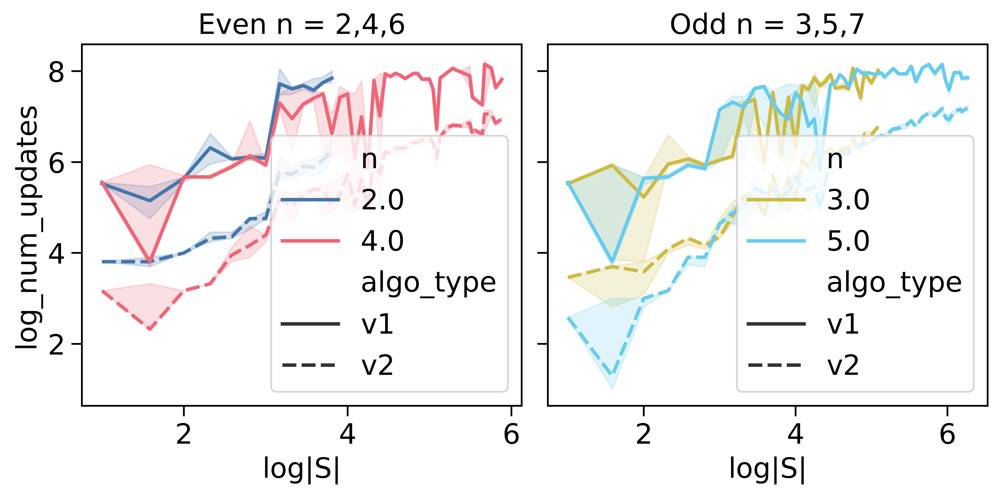

In [13]:
# Full palette with consistent mapping
palette = sns.color_palette()
color_map = {n: palette[i] for i, n in enumerate([2, 4, 6, 3, 5, 7])}

fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# Even
even_ns = [2, 4, 6]
temp_even = all_mms3[
    (all_mms3["state_type"] == "gibbs")
    & (all_mms3["num_updates"] > 0)
    & (all_mms3["n"].isin(even_ns))
].copy()
temp_even = temp_even.dropna(subset=["num_updates"])
temp_even["log_num_updates"] = np.log2(temp_even["num_updates"])

sns.lineplot(
    data=temp_even,
    x="log|S|",
    y="log_num_updates",
    hue="n",
    palette={n: color_map[n] for n in even_ns},
    estimator=np.median,
    style="algo_type",
    ax=axes[0],
)
axes[0].set_title("Even n = 2,4,6")

# Odd
odd_ns = [3, 5, 7]
temp_odd = all_mms3[
    (all_mms3["state_type"] == "gibbs")
    & (all_mms3["num_updates"] > 0)
    & (all_mms3["n"].isin(odd_ns))
].copy()
temp_odd = temp_odd.dropna(subset=["num_updates"])
temp_odd["log_num_updates"] = np.log2(temp_odd["num_updates"])

sns.lineplot(
    data=temp_odd,
    x="log|S|",
    y="log_num_updates",
    hue="n",
    palette={n: color_map[n] for n in odd_ns},
    estimator=np.median,
    style="algo_type",
    ax=axes[1],
)
axes[1].set_title("Odd n = 3,5,7")

plt.tight_layout()
plt.show()

# step 3 fits

## get exponent of eps from slope of log samples_needed vs log(eps)

In [14]:
plot_df = bigs3[
    (bigs3["|S|"] > 1)
]


# Get unique values
state_types = ["gibbs", "zero", "ghz"]
n_values = sorted(plot_df["n"].unique())

# Prepare subplots
fig, axes = plt.subplots(
    nrows=len(n_values),
    ncols=3,
    figsize=(18, 5 * len(n_values)),
    sharex="col",
    sharey=False,
)

fit_results = []
for i, n in enumerate(n_values):
    for j, state in enumerate(state_types):

        ax = axes[i, j]
        temp = plot_df[(plot_df["n"] == n) & (plot_df["state_type"] == state)].copy()

        temp["|S|/2**n"] = temp["|S|"] / 2 ** temp["n"]
        temp = temp.dropna(subset=["epsilon_mm", "med_samples", "samples_needed"])
        temp["log_inv_eps"] = np.log2(1 / temp["epsilon_mm"])
        temp["log_samples_needed"] = np.log2(temp["samples_needed"].astype(float))

        if temp.empty:
            continue

        sns.scatterplot(
            data=temp,
            x="log_inv_eps",
            y="log_samples_needed",
            hue="|S|/2**n",
            palette="viridis",
            ax=ax,
            alpha=0.3,
        )

        x = temp["log_inv_eps"].values.reshape(-1, 1)
        y = temp["log_samples_needed"].values

        reg = BootstrappedRegressor(
            model_cls=LinearRegression, n_bootstrap=100, random_state=0
        )
        reg.fit(x, y)

        slope = reg.slope_med
        slope_ci = reg.get_slope_ci(ci=95)
        intercept = reg.intercept_med
        intercept_ci = reg.get_intercept_ci(ci=95)

        x_fit = np.linspace(min(x), max(x), 100).flatten()
        y_fit, y_lower, y_upper = reg.predict_band(x_fit, ci=95)

        ax.plot(
            x_fit,
            y_fit,
            color="black",
            label=f"slope={slope:.3f}",
        )
        ax.fill_between(x_fit, y_lower, y_upper, color="black", alpha=0.2)
        ax.set_title(
            f"n={n}, {state}\nFit: $\\log(N) = {slope:.2e} \\cdot \\log(1/\\epsilon) + {{{intercept:.2f}}}$"
        )

        fit_results.append(
            {
                "n": n,
                "State": state,
                "slope": slope,
                "slope_ci_low": slope_ci[0],
                "slope_ci_high": slope_ci[1],
                "intercept": intercept,
                "intercept_ci_low": intercept_ci[0],
                "intercept_ci_high": intercept_ci[1],
            }
        )

        ax.set_xlim(np.log2(1 / 0.55), np.log2(1 / 0.05))
        ax.grid(True)

plt.tight_layout()
plt.show()

In [15]:
fit_results_df = pd.DataFrame(fit_results)
name_map = {
    "gibbs": "Gibbs",
    "zero": "Zero",
    "ghz": "GHZ",
}
fit_results_df["State"] = fit_results_df["State"].apply(lambda x: name_map[x])
fit_table_step3 = fit_results_df.set_index(["n", "State"]).copy()


def clean_zero(x):
    x_rounded = round(x, 2)
    return f"{0.00:.2f}" if x_rounded == 0 else f"{x_rounded:.2f}"


fit_table_step3["slope"] = fit_table_step3["slope"].map(clean_zero)
fit_table_step3["slope_CI"] = fit_table_step3.apply(
    lambda row: f"[{clean_zero(row.slope_ci_low)}, {clean_zero(row.slope_ci_high)}]",
    axis=1,
)

fit_table_step3 = fit_table_step3[["slope", "slope_CI"]]
fit_table_step3.columns = [r"$\varepsilon$ exponent", "P[2.5, 97.5]"]

fit_table_step3

$\varepsilon$ exponent    P[2.5, 97.5]
n   State                                       
2.0 Gibbs                   0.87    [0.84, 0.91]
    Zero                   -0.04  [-0.06, -0.01]
    GHZ                    -0.06  [-0.09, -0.03]
3.0 Gibbs                   1.73    [1.68, 1.78]
    Zero                   -0.03  [-0.06, -0.01]
    GHZ                    -0.05  [-0.09, -0.02]
4.0 Gibbs                   2.17    [2.11, 2.23]
    Zero                   -0.10  [-0.16, -0.04]
    GHZ                    -0.08  [-0.12, -0.04]
5.0 Gibbs                   2.21    [2.16, 2.28]
    Zero                   -0.09  [-0.14, -0.05]
    GHZ                    -0.08  [-0.14, -0.04]

In [16]:
# join tables fit_table_step3, fit_table_step2, fit_table_step1
# Flatten MultiIndex columns in step2
fit_table_step2.columns = [
    "_".join(col) if isinstance(col, tuple) else col for col in fit_table_step2.columns
]

# Reset index to bring 'n' and 'State' into columns
merged_table = (
    fit_table_step1.reset_index()
    .merge(
        fit_table_step2.reset_index(),
        on=["n", "State"],
        how="outer",
    )
    .set_index(["n", "State"])
)
merged_table = (
    merged_table.reset_index()
    .merge(
        fit_table_step3.reset_index(),
        on=["n", "State"],
        how="outer",
    )
    .set_index(["n", "State"])
)


# Reformat the columns to have a MultiIndex
merged_table.columns = pd.MultiIndex.from_tuples(
    [
        ("Step 1", "", "$\\alpha_1$"),
        ("Step 1", "", "P[2.5, 97.5]"),
        ("Step 2", "v1", "$\\alpha_2$"),
        ("Step 2", "v1", "P[2.5, 97.5]"),
        ("Step 2", "v2", "$\\alpha_3$"),
        ("Step 2", "v2", "P[2.5, 97.5]"),
        ("Step 3", "", "$\\alpha_4$"),
        ("Step 3", "", "P[2.5, 97.5]"),
    ]
)

# map LaTeX → nicer Unicode headers
nice = {
    "$\\alpha_1$": "α₁",
    "$\\alpha_2$": "α₂",
    "$\\alpha_3$": "α₃",
    "$\\alpha_4$": "α₄",
}


# replace only the 3rd level (level-2) of the MultiIndex
merged_table.columns = merged_table.columns.set_levels(
    merged_table.columns.levels[2].to_series().replace(nice), level=2
)

def highlight_smaller(row):
    v1 = row[("Step 2", "v1", "α₂")]
    v2 = row[("Step 2", "v2", "α₃")]
    styles = pd.Series("", index=row.index, dtype="object")
    if pd.notnull(v1) and pd.notnull(v2) and v2 < v1:
        styles[("Step 2", "v2", "α₃")] = "background:#068813;font-weight:bold"
    return styles


def fade_ci(val):
    return "color:#999;" if pd.notnull(val) else ""  # lighter grey

# list all P[...] columns once
ci_cols = [c for c in merged_table.columns if str(c[2]).startswith("P[")]

styled = (
    merged_table.style.apply(highlight_smaller, axis=1)
    .set_properties(  # fade CI columns
        subset=ci_cols, **{"color": "#999", "font-size": "75%"}
    )
    .format(precision=2)
)
styled